In [1]:
from pycaret.clustering import *
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mlt
mlt.rcParams['figure.dpi'] = 105
%matplotlib inline

# About Dataset
### Clustering
Context
Expression levels of 77 proteins measured in the cerebral cortex of 8 classes of control and Down syndrome mice exposed to context fear conditioning, a task used to assess associative learning.

Content
The data set consists of the expression levels of 77 proteins/protein modifications that produced detectable signals in the nuclear fraction of cortex. There are 38 control mice and 34 trisomic mice (Down syndrome), for a total of 72 mice. In the experiments, 15 measurements were registered of each protein per sample/mouse. Therefore, for control mice, there are 38x15, or 570 measurements, and for trisomic mice, there are 34x15, or 510 measurements. The dataset contains a total of 1080 measurements per protein. Each measurement can be considered as an independent sample/mouse.

The eight classes of mice are described based on features such as genotype, behavior and treatment. According to genotype, mice can be control or trisomic. According to behavior, some mice have been stimulated to learn (context-shock) and others have not (shock-context) and in order to assess the effect of the drug memantine in recovering the ability to learn in trisomic mice, some mice have been injected with the drug and others have not.

Classes:

c-CS-s: control mice, stimulated to learn, injected with saline (9 mice)

c-CS-m: control mice, stimulated to learn, injected with memantine (10 mice)

c-SC-s: control mice, not stimulated to learn, injected with saline (9 mice)

c-SC-m: control mice, not stimulated to learn, injected with memantine (10 mice)

t-CS-s: trisomy mice, stimulated to learn, injected with saline (7 mice)

t-CS-m: trisomy mice, stimulated to learn, injected with memantine (9 mice)

t-SC-s: trisomy mice, not stimulated to learn, injected with saline (9 mice)

t-SC-m: trisomy mice, not stimulated to learn, injected with memantine (9 mice)

Attribute Information
[1] Mouse ID

[2:78] Values of expression levels of 77 proteins; the names of proteins are followed by N indicating that they were measured in the nuclear fraction. For example: DYRK1A_n

[79] Genotype: control (c) or trisomy (t)

[80] Treatment type: memantine (m) or saline (s)

[81] Behavior: context-shock (CS) or shock-context (SC)

[82] Class: c-CS-s, c-CS-m, c-SC-s, c-SC-m, t-CS-s, t-CS-m, t-SC-s, t-SC-m

Inspiration
The aim is to identify subsets of proteins that are discriminant between the classes.

In [2]:
df = pd.read_csv("mice.csv")
df

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,Bcatenin_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.687906,0.306382,0.402698,0.296927,1.022060,0.605673,1.877684,2.308745,0.441599,0.859366,0.416289,0.369608,0.178944,1.866358,3.685247,1.537227,0.264526,0.319677,0.813866,0.165846,0.453910,3.037621,0.369510,0.458539,0.335336,0.825192,0.576916,0.448099,0.586271,0.394721,0.339571,0.482864,0.294170,0.182150,0.842725,0.192608,1.443091,0.294700,0.354605,1.339070,0.170119,0.159102,0.188852,0.106305,0.144989,0.176668,0.125190,0.115291,0.228043,0.142756,0.430957,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.695006,0.299051,0.385987,0.281319,0.956676,0.587559,1.725774,2.043037,0.445222,0.834659,0.400364,0.356178,0.173680,1.761047,3.485287,1.509249,0.255727,0.304419,0.780504,0.157194,0.430940,2.921882,0.342279,0.423560,0.324835,0.761718,0.545097,0.420876,0.545097,0.368255,0.321959,0.454519,0.276431,0.182086,0.847615,0.194815,1.439460,0.294060,0.354548,1.306323,0.171427,0.158129,0.184570,0.106592,0.150471,0.178309,0.134275,0.118235,0.238073,0.142037,0.457156,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.677348,0.291276,0.381002,0.281710,1.003635,0.602449,1.731873,2.017984,0.467668,0.814329,0.399847,0.368089,0.173905,1.765544,3.571456,1.501244,0.259614,0.311747,0.785154,0.160895,0.423187,2.944136,0.343696,0.425005,0.324852,0.757031,0.543620,0.404630,0.552994,0.363880,0.313086,0.447197,0.256648,0.184388,0.856166,0.200737,1.524364,0.301881,0.386087,1.279600,0.185456,0.148696,0.190532,0.108303,0.145330,0.176213,0.132560,0.117760,0.244817,0.142445,0.510472,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.583277,0.296729,0.377087,0.313832,0.875390,0.520293,1.566852,2.132754,0.477671,0.727705,0.385639,0.362970,0.179449,1.286277,2.970137,1.419710,0.259536,0.279218,0.734492,0.162210,0.410615,2.500204,0.344509,0.429211,0.330121,0.746980,0.546763,0.386860,0.547849,0.366771,0.328492,0.442650,0.398534,0.161768,0.760234,0.184169,1.612382,0.296382,0.290680,1.198765,0.159799,0.166112,0.185323,0.103184,0.140656,0.163804,0.123210,0.117439,0.234947,0.145068,0.430996,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.550960,0.286961,0.363502,0.277964,0.864912,0.507990,1.480059,2.013697,0.483416,0.687794,0.367531,0.355311,0.174836,1.324695,2.896334,1.359876,0.250705,0.273667,0.702699,0.154827,0.398550,2.456560,0.329126,0.408755,0.313415,0.691956,0.536860,0.360816,0.512824,0.351551,0.312206,0.419095,0.393447,0.160200,0.768113,0.185718,1.645807,0.296829,0.309345,1.206995,0.164650,0.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MouseID          1080 non-null   object 
 1   DYRK1A_N         1077 non-null   float64
 2   ITSN1_N          1077 non-null   float64
 3   BDNF_N           1077 non-null   float64
 4   NR1_N            1077 non-null   float64
 5   NR2A_N           1077 non-null   float64
 6   pAKT_N           1077 non-null   float64
 7   pBRAF_N          1077 non-null   float64
 8   pCAMKII_N        1077 non-null   float64
 9   pCREB_N          1077 non-null   float64
 10  pELK_N           1077 non-null   float64
 11  pERK_N           1077 non-null   float64
 12  pJNK_N           1077 non-null   float64
 13  PKCA_N           1077 non-null   float64
 14  pMEK_N           1077 non-null   float64
 15  pNR1_N           1077 non-null   float64
 16  pNR2A_N          1077 non-null   float64
 17  pNR2B_N       

In [4]:
df.shape

(1080, 82)

In [5]:
df.duplicated().sum()

0

In [6]:
df.nunique()

MouseID            1080
DYRK1A_N           1077
ITSN1_N            1076
BDNF_N             1077
NR1_N              1077
NR2A_N             1077
pAKT_N             1076
pBRAF_N            1075
pCAMKII_N          1077
pCREB_N            1077
pELK_N             1077
pERK_N             1077
pJNK_N             1076
PKCA_N             1077
pMEK_N             1077
pNR1_N             1077
pNR2A_N            1077
pNR2B_N            1077
pPKCAB_N           1077
pRSK_N             1077
AKT_N              1077
BRAF_N             1077
CAMKII_N           1077
CREB_N             1073
ELK_N              1062
ERK_N              1077
GSK3B_N            1077
JNK_N              1077
MEK_N              1072
TRKA_N             1075
RSK_N              1074
APP_N              1077
Bcatenin_N         1062
SOD1_N             1077
MTOR_N             1077
P38_N              1075
pMTOR_N            1077
DSCR1_N            1077
AMPKA_N            1075
NR2B_N             1077
pNUMB_N            1077
RAPTOR_N        

In [7]:
df.describe()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,Bcatenin_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1062.000000,1077.000000,1077.000000,1077.000000,1073.000000,1077.000000,1077.000000,1077.000000,1062.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,0.545904,0.313505,0.317939,0.275033,0.825813,0.726933,1.561965,1.525338,0.442848,0.682236,0.378519,0.363357,0.180492,1.173400,2.474492,1.172603,0.241644,0.272789,0.693180,0.168417,0.404808,2.146550,0.542635,0.452459,0.415311,0.759047,0.585186,0.368370,0.565317,0.357095,0.315813,0.418605,0.394475,0.181080,0.943116,0.161211,1.706599,0.292434,0.429226,1.197420,0.216482,0.166631,0.179307,0.121521,0.156478,0.181300,0.210489,0.120889,0.221851,0.126560,0.527349,0.291276,1.548348,2.235236,0.159821,1.239270,0.848767,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,0.345309,0.051978,0.052236,0.046164,0.117969,0.188013,0.270737,0.481780,0.066672,0.127434,0.216388,0.052352,0.026370,0.335786,0.653397,0.244752,0.033901,0.041075,0.120825,0.028138,0.061173,0.435742,0.280568,0.065488,0.089290,0.122446,0.100601,0.062583,0.088201,0.063025,0.054163,0.067288,0.156170,0.029296,0.172838,0.019308,0.578442,0.037380,0.137440,0.361743,0.185309,0.031896,0.018826,0.014276,0.015071,0.024919,0.069010,0.013233,0.034886,0.026885,0.082057,0.030015,0.248132,0.254395,0.024150,0.173580,0.094311,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,0.149155,0.052110,0.191431,0.056818,0.500160,0.281285,0.301609,0.567840,0.095942,0.064421,0.143894,0.212960,0.113636,0.497695,1.131796,0.151124,0.046298,0.147201,0.198743,0.107394,0.235595,1.134886,0.217120,0.201143,0.227880,0.166579,0.155321,0.226409,0.184785,0.185598,0.194824,0.237777,0.131120,0.117999,0.344120,0.099976,0.598767,0.181157,0.130206,0.529108,0.052528,-0.062008,0.072326,0.067254,0.100217,0.099734,0.096233,0.086114,0.111382,0.072580,0.284001,0.207438,0.853176,1.206098,0.101233,0.750664,0.577397,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,0.337405,0.281242,0.281829,0.244287,0.743491,0.590303,1.381288,1.168258,0.404144,0.596816,0.264334,0.330859,0.161830,0.944435,1.991756,1.023134,0.220400,0.247096,0.617074,0.149622,0.366339,1.826707,0.319639,0.410389,0.351992,0.683501,0.530881,0.326621,0.514892,0.312766,0.276127,0.371976,0.281090,0.

In [8]:
df.describe(include ='object')

,MouseID,Genotype,Treatment,Behavior,class
count,1080,1080,1080,1080,1080
unique,1080,2,2,2,8
top,309_1,Control,Memantine,S/C,c-CS-m
freq,1,570,570,555,150


In [9]:
df.drop(columns='MouseID',inplace =True)

Text(0.5, 1.0, 'Correlation Matrix(for dataset)')

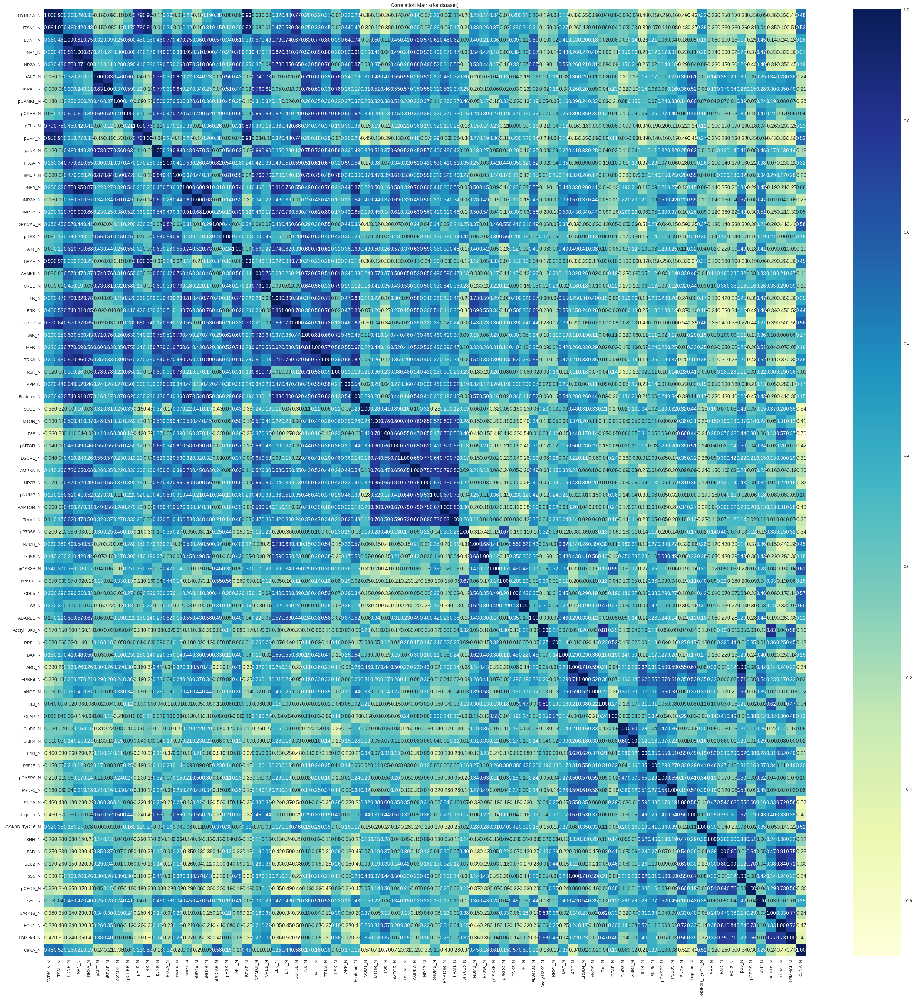

In [10]:
#Correlation for numeric
plt.figure(figsize=(40,40))
sns.heatmap(df.corr(),annot=True,fmt='.2f',cmap="YlGnBu")
plt.title("Correlation Matrix(for dataset)")

In [11]:
df.columns

Index(['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N',
       'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N',
       'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N',
       'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N',
       'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N',
       'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N',
       'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N',
       'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'RRP1_N',
       'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N', 'GluR3_N',
       'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N',
       'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N',
       'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N',
       'Genotype', 'Treatment', 'Behavior', 'class'],
      dtype='object')

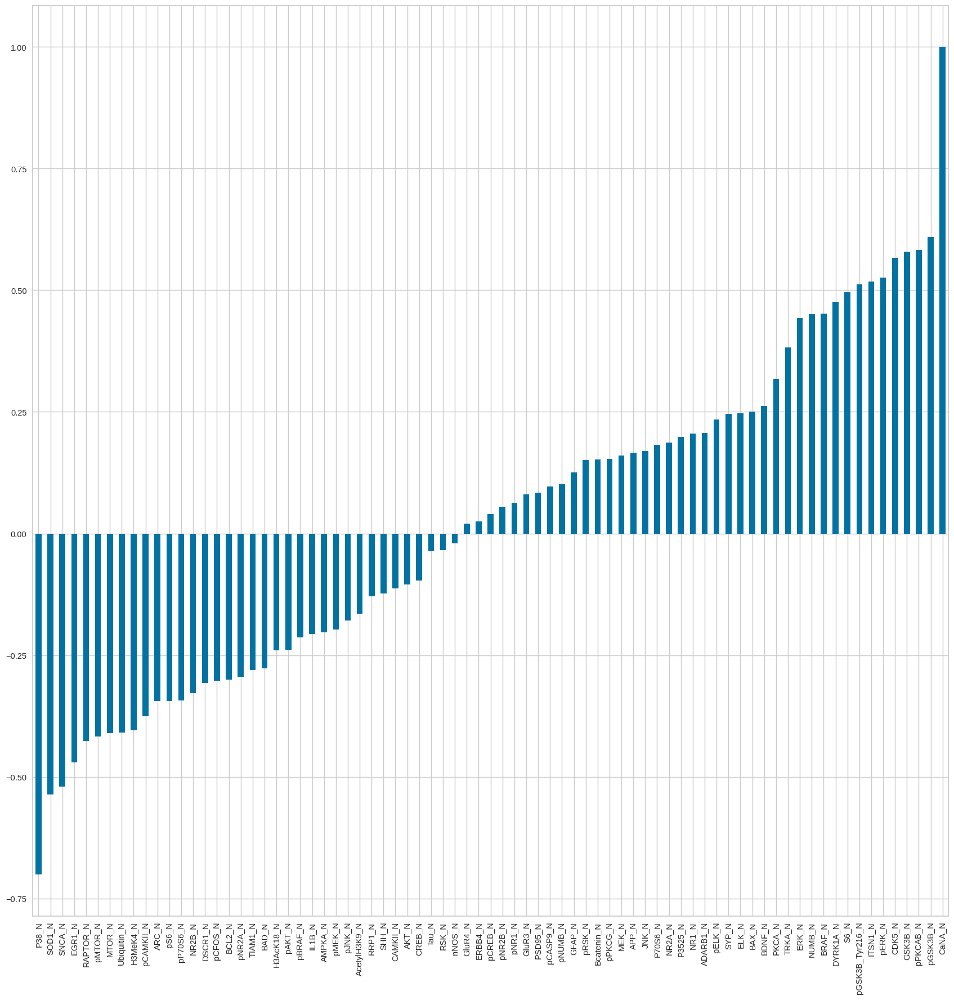

In [15]:
# plot correlation
plt.figure(figsize=(20,20))
df_obj = df.select_dtypes(exclude ='object')
df_obj.corr()['CaNA_N'].sort_values().plot(kind='bar')
plt.show()

In [14]:
df_num=df.select_dtypes(exclude ='object')
df_num.shape

(1080, 77)

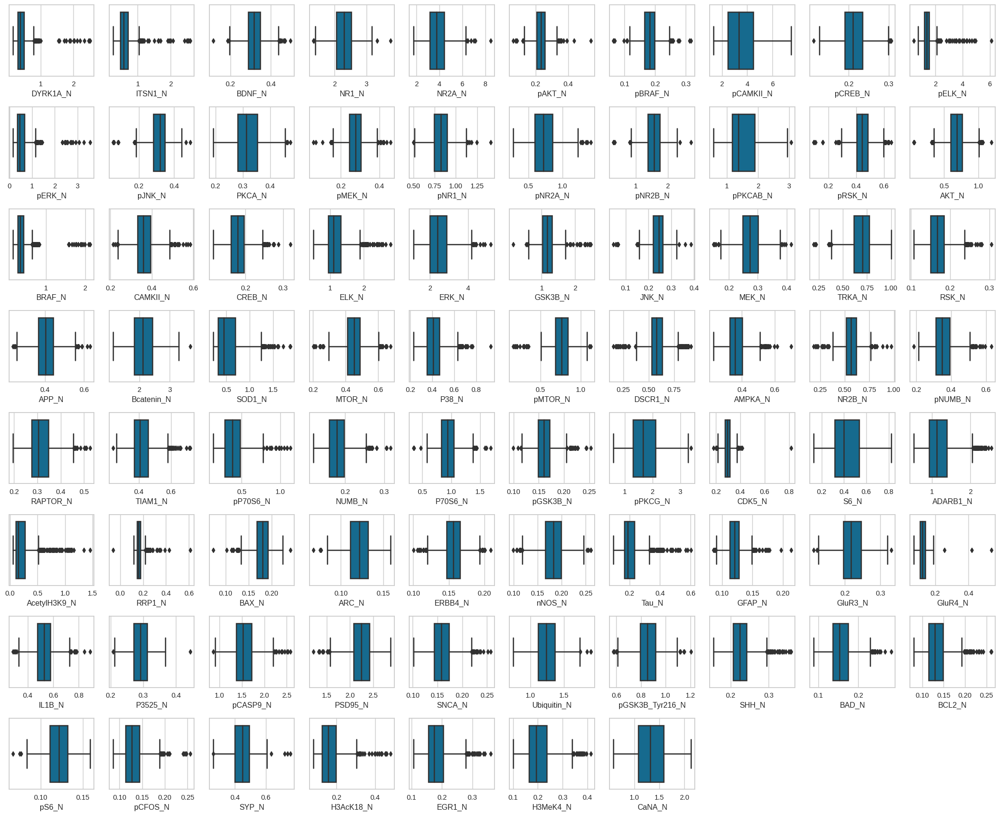

In [16]:
#Boxplot for checking of outliers
plt.figure(figsize=(20,20))
plotnumber = 1

for col in df_num.columns:
    if plotnumber < 78:
        plt.subplot(10,10,plotnumber)
        sns.boxplot(df_num[col],orient='v')
        plt.xlabel(col)
    plotnumber +=1
plt.tight_layout()


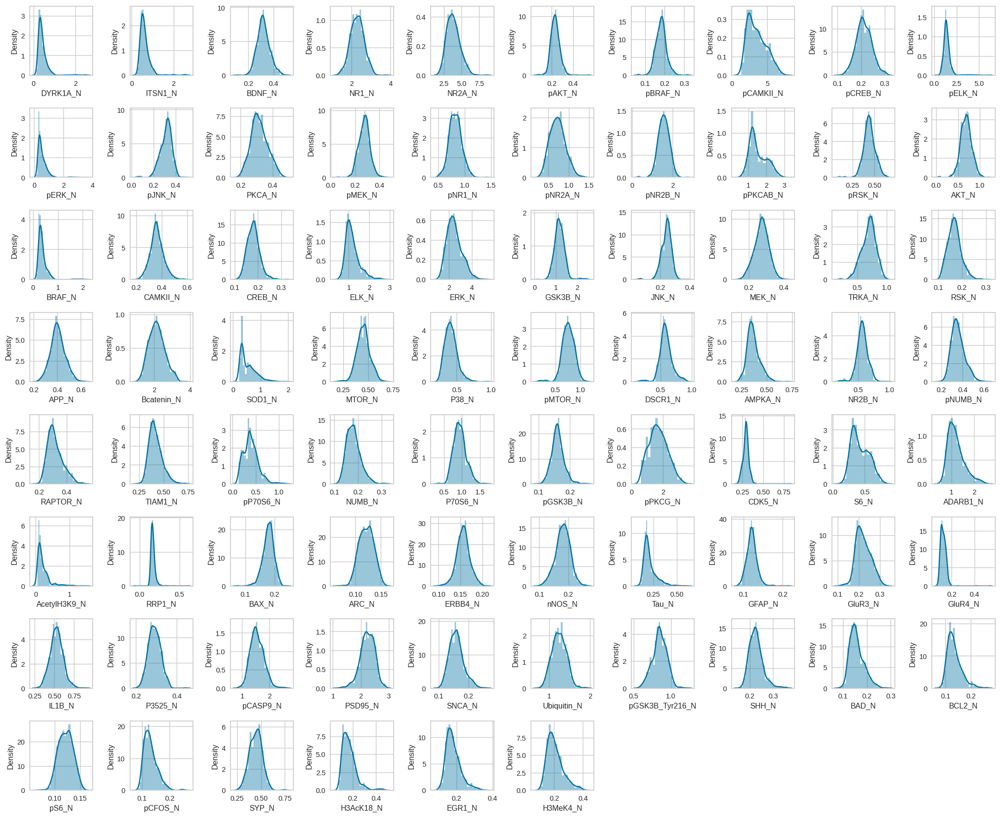

In [17]:
# histogram plot(for checking of skew,gaussian distribution)
plt.figure(figsize=(20,20))
plotnumber = 1

for col in df_num.columns:
    if plotnumber < 77:
        plt.subplot(10,10,plotnumber)
        sns.distplot(df_num[col])
        plt.xlabel(col)
    plotnumber +=1
plt.tight_layout()


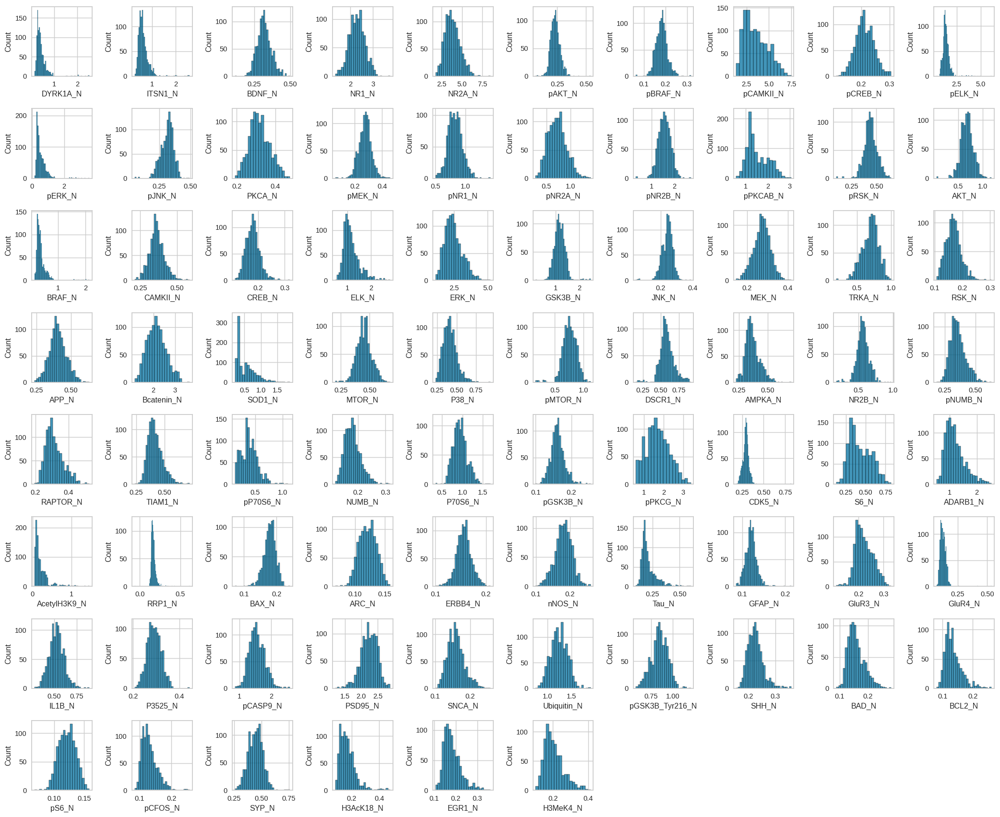

In [18]:
# histogram plot(for checking of skew,gaussian distribution)
plt.figure(figsize=(20,20))
plotnumber = 1

for col in df_num.columns:
    if plotnumber < 77:
        plt.subplot(10,10,plotnumber)
        sns.histplot(df_num[col])
        plt.xlabel(col)
    plotnumber +=1
plt.tight_layout()

In [19]:
data = df.sample(frac=0.95,random_state =786,ignore_index=True)
unseen = df.drop(data.index)
data.shape,unseen.shape

((1026, 81), (54, 81))

<b>Pycaret<b/> :  is an open-source,low-code machine learning library in python that
automates machine learning workflows.

it is an end-to-end machine learning and model management tool that exponentially<br>
speeds up the experiment cycle and makes you more productive.<br>
compare with the other open-source machine learning libraries.<br><br><b>Pycaret<b> is an alternate low-code
library that can be used to replace hundreds of lines of code with few lines only.<br>

Pycaret is essentiall a Python wrapper around several machine learning<br> libraries and frameworks,
such as scikit-learn,XGBoost,LightGBM,CatBoost,spaCy,Optuna,Hyperopt,Ray,<br>
and a few more

In [20]:
setup(data,
      normalize=True,
      session_id=123)

,Description,Value
0,session_id,123
1,Original Data,"(1026, 81)"
2,Missing Values,True
3,Numeric Features,77
4,Categorical Features,4
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(1026, 91)"
9,CPU Jobs,-1


(False,
 None,
 10,
 'lightgbm',
 None,
 False,
       DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N   pBRAF_N  \
 0     0.344930  0.626194  0.383583  2.534561  4.097317  0.303547  0.222829   
 1     0.630001  0.839187  0.357777  2.651229  4.261675  0.253184  0.185257   
 2     0.555122  0.726229  0.278319  2.097249  2.897553  0.222222  0.174356   
 3     0.275849  0.430764  0.285166  2.265254  3.250091  0.189258  0.157837   
 4     0.304788  0.617299  0.335164  2.638236  4.876609  0.280590  0.199417   
 ...        ...       ...       ...       ...       ...       ...       ...   
 1021  0.673085  0.877280  0.341103  2.696291  4.180077  0.194568  0.161127   
 1022  0.454248  0.616073  0.334571  2.295698  4.393972  0.257261  0.204848   
 1023  0.264036  0.429417  0.276054  2.288072  3.187265  0.188879  0.161256   
 1024  0.853106  1.071848  0.280459  2.080645  3.850307  0.181285  0.154625   
 1025  0.366239  0.589233  0.364472  2.534339  4.605254  0.234303  0.187301   
 
  

In [21]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


# kmeans

In [22]:
kmeans = create_model("kmeans")


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1187,137.5261,2.0715,0,0,0


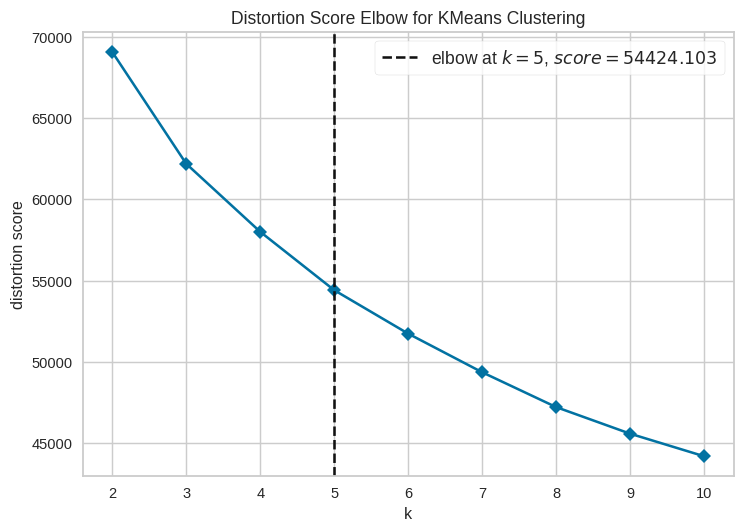

In [23]:
plot_model(kmeans,'elbow')

In [29]:
kmeans = create_model("kmeans",num_clusters=5)


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1138,126.6788,2.0919,0,0,0


In [30]:
assign_kmeans = assign_model(kmeans)
assign_kmeans

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class,Cluster
0,0.344930,0.626194,0.383583,2.534561,4.097317,0.303547,0.222829,4.592769,0.239427,1.360164,...,0.455172,0.252700,0.218868,0.249187,1.139493,Ts65Dn,Memantine,S/C,t-SC-m,Cluster 3
1,0.630001,0.839187,0.357777,2.651229,4.261675,0.253184,0.185257,3.816673,0.204940,1.716583,...,0.496423,0.155008,0.153219,NaN,1.642886,Control,Memantine,C/S,c-CS-m,Cluster 0
2,0.555122,0.726229,0.278319,2.097249,2.897553,0.222222,0.174356,1.867880,0.203379,1.610136,...,0.344964,0.136109,0.155530,0.185484,1.657670,Ts65Dn,Memantine,C/S,t-CS-m,Cluster 2
3,0.275849,0.430764,0.285166,2.265254,3.250091,0.189258,0.157837,2.917611,0.202594,1.734746,...,0.390880,0.127944,0.207671,0.175357,0.893598,Control,Saline,S/C,c-SC-s,Cluster 4
4,0.304788,0.617299,0.335164,2.638236,4.876609,0.280590,0.199417,4.835421,0.236314,1.226532,...,0.470932,0.245277,0.202171,0.240372,0.795637,Ts65Dn,Memantine,S/C,t-SC-m,Cluster 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1021,0.673085,0.877280,0.341103,2.696291,4.180077,0.194568,0.161127,2.479834,0.222031,1.609343,...,0.402853,0.143983,NaN,NaN,1.720543,Ts65Dn,Memantine,C/S,t-CS-m,Cluster 2
1022,0.454248,0.616073,0.334571,2.295698,4.393972,0.257261,0.204848,3.968334,0.249181,1.447259,...,0.331336,NaN,NaN,NaN,1.472336,Control,Saline,C/S,c-CS-s,Cluster 2
1023,0.264036,0.429417,0.276054,2.288072,3.187265,0.188879,0.161256,2.810583,0.192646,4.077489,...,0.392842,0.140689,0.195755,0.199139,0.914582,Control,Saline,S/C,c-SC-s,Cluster 4
1024,0.853106,1.071848,0.280459,2.080645,3.850307,0.181285,0.154625,2.118502,0.201146,2.150227,...,0.349790,0.105418,0.142835,0.136392,1.653082,Ts65Dn,Memantine,C/S,t-CS-m,Cluster 2


In [31]:
prediction_kmeans = predict_model(kmeans,data = unseen)
prediction_kmeans

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class,Cluster
1026,0.361782,0.565987,0.376145,2.774771,4.450250,0.262906,0.238968,6.041007,0.229808,1.697336,...,0.360485,0.208611,NaN,0.270820,0.782176,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1027,0.329361,0.503216,0.326145,2.487893,3.925842,0.231177,0.195611,5.337306,0.210556,1.355846,...,0.391032,0.211478,NaN,0.255582,0.882451,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1028,0.328314,0.500465,0.363265,2.409370,3.796988,0.226250,0.187024,5.330917,0.203198,1.237591,...,0.394725,0.201974,NaN,0.241815,0.881029,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1029,0.377490,0.528331,0.379560,2.689263,3.978008,0.266753,0.229495,5.441138,0.227684,1.655369,...,0.388407,0.262620,NaN,0.262620,0.781328,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1030,0.367813,0.478322,0.346371,2.356975,3.561499,0.252121,0.226437,4.868520,0.204288,1.403629,...,0.360577,0.264670,NaN,0.247165,0.783654,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1031,0.296432,0.430919,0.314811,2.175135,3.218595,0.233297,0.186162,4.482811,0.186595,1.212973,...,0.368850,0.207169,NaN,0.271693,0.854759,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1032,0.300902,0.426960,0.395093,2.196560,3.129724,0.239707,0.196560,4.445008,0.197970,1.410039,...,0.334225,0.209932,NaN,0.276836,0.689266,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1033,0.287620,0.402882,0.361793,2.049893,2.749733,0.274013,0.196638,3.827375,0.186766,1.285486,...,0.328882,0.237809,NaN,0.255964,0.754839,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1034,0.282083,0.378520,0.336905,1.870920,2.692749,0.206579,0.199850,3.801146,0.163220,1.090954,...,0.386954,0.224870,NaN,0.247632,0.800336,Ts65Dn,Saline,S/C,t-SC-s,Cluster 3
1035,0.437860,0.705300,0.417971,2.796769,5.460777,0.279859,0.190813,6.455830,0.283493,1.417062,...,0.475056,0.151638,0.168871,0.163218,1.194611,Ts65Dn,Saline,S/C,t-SC-s,Cluster 0


    * 'cluster' - Cluster PCA Plot (2d)              
    * 'tsne' - Cluster TSnE (3d)
    * 'elbow' - Elbow Plot 
    * 'silhouette' - Silhouette Plot         
    * 'distance' - Distance Plot   
    * 'distribution' - Distribution Plot


In [32]:
plot_model(kmeans,'cluster')

In [34]:
plot_model(kmeans,'tsne')

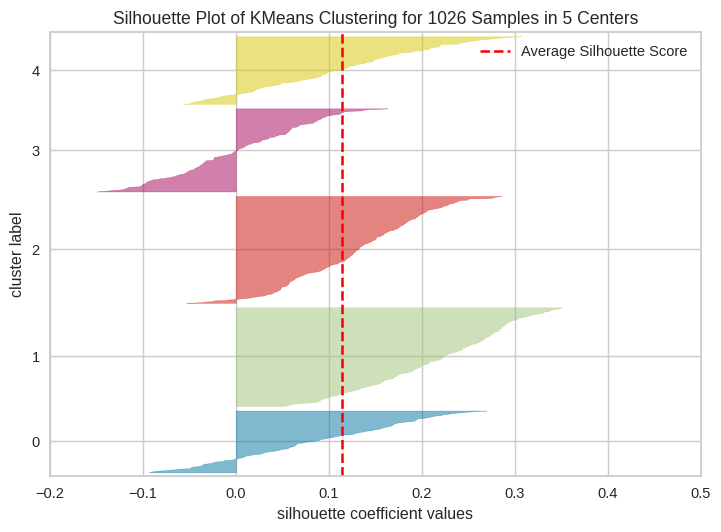

In [35]:
plot_model(kmeans,'silhouette')

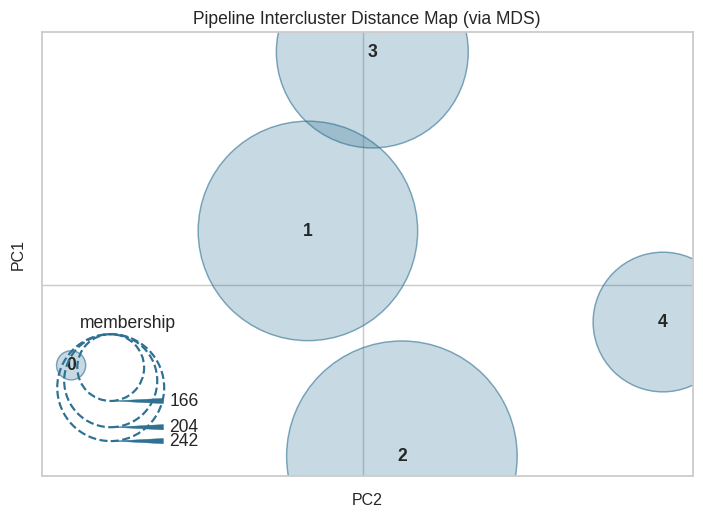

In [36]:
plot_model(kmeans,'distance')

In [37]:
plot_model(kmeans,'distribution')

In [38]:
save_model(kmeans,'kmeans')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  KMe